#**Descargar el dataset**

**Descargar el dataset desde Kaggle**

In [ ]:
import os

# Instalar la biblioteca de Kaggle en el entorno de Colab.
!pip install kaggle

# Descargar el dataset "Cause of Deaths Around the World" de Kaggle.
!kaggle datasets download iamsouravbanerjee/cause-of-deaths-around-the-world -p /content

# Descomprime el archivo .zip descargado en la carpeta '/content'.
!unzip /content/cause-of-deaths-around-the-world.zip -d /content

# Elimina el archivo .zip de la carpeta '/content' para liberar espacio.
!rm /content/cause-of-deaths-around-the-world.zip

# Listar los archivos en la carpeta /content para verificar su presencia
content_files = os.listdir('/content')
print(f"Archivos en /content: {content_files}")

# Verificar si el archivo 'cause_of_deaths.csv' está presente
if 'cause_of_deaths.csv' in content_files:
    print("\n--------------------------------------------------------------------")
    print("Archivo 'cause_of_deaths.csv' encontrado exitosamente en /content.")
    print("--------------------------------------------------------------------")
else:
    print("\n--------------------------------------------------------------------------------------------------------------------------")
    print("Error: No se encontró el archivo 'cause_of_deaths.csv'. Sube el archivo manualmente o verifica la descarga desde Kaggle.")
    print("--------------------------------------------------------------------------------------------------------------------------")

Dataset URL: https://www.kaggle.com/datasets/iamsouravbanerjee/cause-of-deaths-around-the-world
License(s): other
  0% 0.00/324k [00:00<?, ?B/s]
100% 324k/324k [00:00<00:00, 45.6MB/s]
Archive:  /content/cause-of-deaths-around-the-world.zip
  inflating: /content/cause_of_deaths.csv  
Archivos en /content: ['.config', 'cause_of_deaths.csv', 'sample_data']

--------------------------------------------------------------------
Archivo 'cause_of_deaths.csv' encontrado exitosamente en /content.
--------------------------------------------------------------------


**Alternativa de carga manual del archivo**

In [ ]:
#Alternativa: Subida manual del archivo si no se puede descargar desde Kaggle.
from google.colab import files
uploaded = files.upload() # Carga manual del archivo CSV en Colab

# Verificar si el archivo 'cause_of_deaths.csv' está presente
if 'cause_of_deaths.csv' in uploaded or os.path.exists('/content/cause_of_deaths.csv'):
    print("Archivo cargado exitosamente.")
else:
    print("Error: No se encontró el archivo.")

Saving cause_of_deaths.csv to cause_of_deaths.csv


# **Información del dataset y la columna de datos a ordenar**

**Importar librerias**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import random

**Lectura e Información del dataset**

In [ ]:
#Cargar el dataset desde el archivo CSV
df = pd.read_csv('/content/cause_of_deaths.csv')

# Verificar la estructura del DataFrame (columnas y tipos de datos)
df.info()

# Mostrar las primeras y ultimas filas
df.head(-1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6120 entries, 0 to 6119
Data columns (total 34 columns):
 #   Column                                      Non-Null Count  Dtype 
---  ------                                      --------------  ----- 
 0   Country/Territory                           6120 non-null   object
 1   Code                                        6120 non-null   object
 2   Year                                        6120 non-null   int64 
 3   Meningitis                                  6120 non-null   int64 
 4   Alzheimer's Disease and Other Dementias     6120 non-null   int64 
 5   Parkinson's Disease                         6120 non-null   int64 
 6   Nutritional Deficiencies                    6120 non-null   int64 
 7   Malaria                                     6120 non-null   int64 
 8   Drowning                                    6120 non-null   int64 
 9   Interpersonal Violence                      6120 non-null   int64 
 10  Maternal Disorders      

,Country/Territory,Code,Year,Meningitis,Alzheimer's Disease and Other Dementias,Parkinson's Disease,Nutritional Deficiencies,Malaria,Drowning,Interpersonal Violence,...,Diabetes Mellitus,Chronic Kidney Disease,Poisonings,Protein-Energy Malnutrition,Road Injuries,Chronic Respiratory Diseases,Cirrhosis and Other Chronic Liver Diseases,Digestive Diseases,"Fire, Heat, and Hot Substances",Acute Hepatitis
0,Afghanistan,AFG,1990,2159,1116,371,2087,93,1370,1538,...,2108,3709,338,2054,4154,5945,2673,5005,323,2985
1,Afghanistan,AFG,1991,2218,1136,374,2153,189,1391,2001,...,2120,3724,351,2119,4472,6050,2728,5120,332,3092
2,Afghanistan,AFG,1992,2475,1162,378,2441,239,1514,2299,...,2153,3776,386,2404,5106,6223,2830,5335,360,3325
3,Afghanistan,AFG,1993,2812,1187,384,2837,108,1687,2589,...,2195,3862,425,2797,5681,6445,2943,5568,396,3601
4,Afghanistan,AFG,1994,3027,1211,391,3081,211,1809,2849,...,2231,3932,451,3038,6001,6664,3027,5739,420,3816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6114,Zimbabwe,ZWE,2014,1422,741,212,2977,3685,734,1257,...,3094,2057,367,2948,2302,2715,1952,4138,615,146
6115,Zimbabwe,ZWE,2015,1439,754,215,3019,2518,770,1302,...,3176,2108,381,2990,2373,2751,1956,4202,632,146
6116,Zimbabwe,ZWE,2016,1457,767,219,3056,2050,801,1342,...,3259,2160,393,3027,2436,2788,1962,4264,648,146
6117,Zimbabwe,ZWE,2017,1460,781,223,2990,2116,818,1363,...,3313,2196,398,2962,2473,2818,2007,4342,654,144


**Verificación de existencia y valores nulos de la columna a ordenar**

In [ ]:
# Verificar que la columna exista dentro del dataset
if "Alzheimer's Disease and Other Dementias" in df.columns:
    print("Columna encontrada.")
else:
    print("Error: La columna 'Alzheimer's Disease and Other Dementias' no existe.")

Columna encontrada.


In [ ]:
# Verificar valores nulos
if df["Alzheimer's Disease and Other Dementias"].isnull().any():
    print("Advertencia: Hay valores nulos en la columna.")
else:
  print("No hay valores nulos en la columna")

No hay valores nulos en la columna


**Conversión de columna a lista**

In [ ]:
# Extraer la columna que vamos a ordenar
deathByAlzheimer = df["Alzheimer's Disease and Other Dementias"].tolist()  # Convierte la columna en una lista

# Mostrar el tamaño y los primeros 20 elementos de la lista para verificar
print('Tamaño de la lista: ', len(deathByAlzheimer), '\nLista: ', deathByAlzheimer[:20])

Tamaño de la lista:  6120 
Lista:  [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449]


**Graficas de la distribución de los datos de la lista**

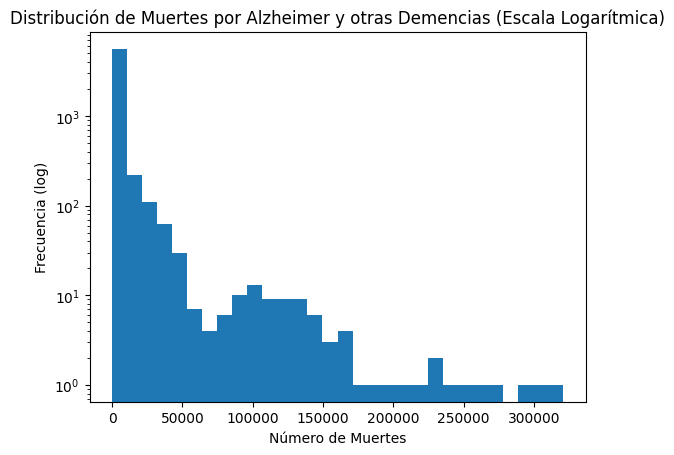

In [ ]:
plt.hist(deathByAlzheimer, bins=30, log=True)  # Escala logarítmica en el eje Y
plt.title("Distribución de Muertes por Alzheimer y otras Demencias (Escala Logarítmica)")
plt.xlabel("Número de Muertes")
plt.ylabel("Frecuencia (log)")
plt.show()

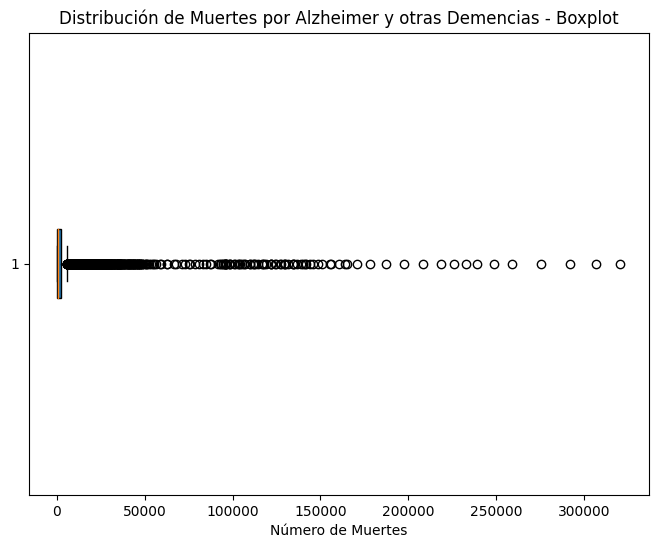

In [ ]:
plt.figure(figsize=(8, 6))
plt.boxplot(deathByAlzheimer, vert=False, patch_artist=True)
plt.title("Distribución de Muertes por Alzheimer y otras Demencias - Boxplot")
plt.xlabel("Número de Muertes")
plt.show()

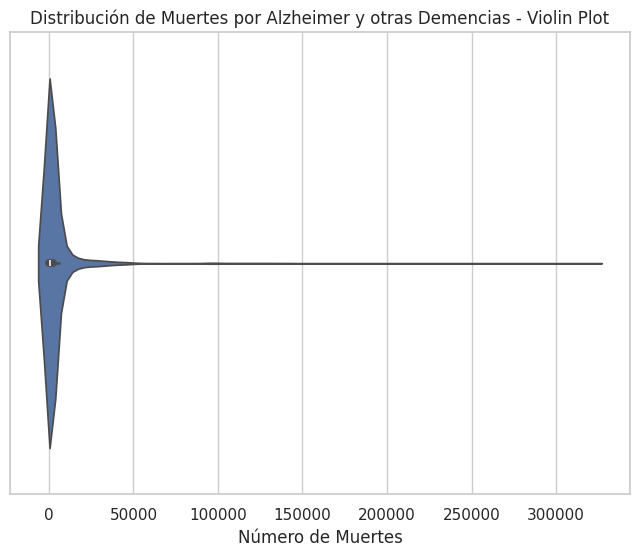

In [ ]:
plt.figure(figsize=(8, 6))
sns.violinplot(x=deathByAlzheimer)
plt.title("Distribución de Muertes por Alzheimer y otras Demencias - Violin Plot")
plt.xlabel("Número de Muertes")
plt.show()

# **Implementación métodos de ordenamiento**

### 1. **Método exclusivo: *Counting sort:***
    Descripción: Ordena contando el número de apariciones de cada valor y utiliza esa información para posicionar los elementos.
    Eficiente para: Listas de enteros en rangos pequeños.
    Complejidad: O(n + k), donde k es el valor máximo del conjunto.

In [ ]:
# Ordena una lista usando Counting Sort en orden descendente, mostrando la construcción del arreglo.
def countingSortDesc(arr, show_steps=False):

    # Hacemos una copia para asegurarnos de no modificar el arreglo original
    originalArr = arr.copy()

    # Validar si la lista está vacía
    if not originalArr:
        return []  # Devolvemos una lista vacía si no hay datos.

    # Encontrar el valor máximo en la lista
    maxValue = max(originalArr)

    # Crear un array de conteo con tamaño maxValue + 1
    count = [0] * (maxValue + 1)  # Cada índice representa un número en 'arr'.

    # Llenar el array de conteo con las frecuencias de cada número
    for num in originalArr:
        count[num] += 1

    # Crear una lista para los datos ordenados en forma descendente
    sortedArr = []
    for value in range(len(count) - 1, -1, -1):  # Iterar de mayor a menor.
        if count[value] > 0:
            sortedArr.extend([value] * count[value])  # Añadir múltiples ocurrencias.
            if show_steps:
                print(f"Construyendo arreglo: {sortedArr}")

    return sortedArr

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataCounting = countingSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no ha sido modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Counting Sort en orden descendente:", sortedDataCounting)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 2. **Bubble Sort**
    Descripción: Compara elementos adyacentes e intercambia si están en el orden incorrecto. Repite hasta que toda la lista esté ordenada.
    Eficiente para: Conjuntos pequeños o casi ordenados.
    Complejidad: O(n²).

In [ ]:
def bubbleSortDesc(arr):

    n = len(arr)  # Longitud de la lista
    sortedArr = arr.copy()  # Crear una copia para no modificar la lista original

    # Bucle externo que controla las pasadas
    for i in range(n - 1):
        swapped = False  # Bandera para controlar si hubo intercambios

        # Bucle interno para comparar pares consecutivos
        for j in range(n - 1 - i):
            if sortedArr[j] < sortedArr[j + 1]:  # Comparación descendente
                # Intercambio si el elemento izquierdo es menor
                sortedArr[j], sortedArr[j + 1] = sortedArr[j + 1], sortedArr[j]
                swapped = True  # Marcar que hubo intercambio

        # Si no hubo intercambios, el arreglo ya está ordenado
        if not swapped:
            break

    return sortedArr

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataBubble = bubbleSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar el resultado
print("Datos ordenados con Bubble Sort en orden descendente:", sortedDataBubble)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 3. **Bubble Sort Mejorado**
    Descripción: Versión optimizada de Bubble Sort que detiene la ejecución si no se realizan intercambios en una pasada.
    Eficiente para: Datos parcialmente ordenados.
    Complejidad: O(n) en el mejor caso.

In [ ]:
def bubbleSortImprovedDesc(arr):

    # Hacer una copia del arreglo para no modificar el original
    sortedArr = arr.copy()
    n = len(sortedArr)  # Longitud del arreglo

    # Bucle externo que controla las pasadas
    for i in range(n - 1):
        swapped = False  # Bandera para controlar si hubo intercambios

        # Bucle interno para comparar pares consecutivos
        for j in range(n - 1 - i):
            if sortedArr[j] < sortedArr[j + 1]:  # Comparación para orden descendente
                # Intercambio si el elemento de la izquierda es menor
                sortedArr[j], sortedArr[j + 1] = sortedArr[j + 1], sortedArr[j]
                swapped = True  # Marcar que hubo intercambio

        # Si no hubo intercambios, la lista ya está ordenada
        if not swapped:
            break  # Salir del bucle externo si ya está ordenado

    return sortedArr  # Devolver el arreglo ordenado

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataBubbleImproved = bubbleSortImprovedDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para confirmar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Bubble Sort Mejorado en orden descendente:", sortedDataBubbleImproved)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 4. **Cocktail Sort**
    Descripción: Variante bidireccional de Bubble Sort que recorre la lista hacia adelante y hacia atrás en cada iteración.
    Eficiente para: Datos con pequeños desajustes.
    Complejidad: O(n²).

In [ ]:
def cocktailSortDesc(arr):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()
    n = len(sortedArr)  # Longitud del arreglo

    # Inicializamos las variables para los límites del recorrido
    start = 0  # Inicio del recorrido
    end = n - 1  # Fin del recorrido
    swapped = True  # Bandera para controlar los intercambios

    # Continuar mientras haya intercambios
    while swapped:
        swapped = False  # Reiniciar la bandera en cada iteración

        # Bucle hacia adelante (del inicio al fin)
        for i in range(start, end):
            if sortedArr[i] < sortedArr[i + 1]:  # Comparación descendente
                # Intercambiar si el elemento actual es menor
                sortedArr[i], sortedArr[i + 1] = sortedArr[i + 1], sortedArr[i]
                swapped = True  # Marcar que hubo intercambio

        # Si no hubo intercambios, la lista ya está ordenada
        if not swapped:
            break  # Terminar el bucle principal

        # Reducimos el límite del recorrido
        end -= 1
        swapped = False  # Reiniciar la bandera para el recorrido hacia atrás

        # Bucle hacia atrás (del fin al inicio)
        for i in range(end, start, -1):
            if sortedArr[i] > sortedArr[i - 1]:  # Comparación descendente
                # Intercambiar si el elemento actual es mayor
                sortedArr[i], sortedArr[i - 1] = sortedArr[i - 1], sortedArr[i]
                swapped = True  # Marcar que hubo intercambio

        # Incrementamos el inicio del recorrido
        start += 1

    return sortedArr  # Devolver la lista ordenada

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataCocktail = cocktailSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Cocktail Sort en orden descendente:", sortedDataCocktail)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 5. **Selection Sort**
    Descripción: Selecciona repetidamente el elemento más pequeño (o más grande) y lo coloca en su posición final.
    Eficiente para: Conjuntos pequeños.
    Complejidad: O(n²)

In [ ]:
def selectionSortDesc(arr):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()
    n = len(sortedArr)  # Longitud del arreglo

    # Recorrer cada posición del arreglo
    for i in range(n - 1):
        # Suponer que el primer elemento no ordenado es el máximo
        maxIndex = i

        # Buscar el elemento más grande en la porción no ordenada
        for j in range(i + 1, n):
            if sortedArr[j] > sortedArr[maxIndex]:  # Comparación descendente
                maxIndex = j  # Actualizar el índice del elemento más grande

        # Intercambiar el elemento más grande encontrado con el primer elemento no ordenado
        sortedArr[i], sortedArr[maxIndex] = sortedArr[maxIndex], sortedArr[i]

    return sortedArr  # Devolver el arreglo ordenado

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataSelection = selectionSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Selection Sort en orden descendente:", sortedDataSelection)


Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 6. **Insertion Sort**
    Descripción: Inserta cada elemento en su lugar correspondiente, desplazando los elementos necesarios hacia la derecha.
    Eficiente para: Listas pequeñas o casi ordenadas.
    Complejidad: O(n²), pero O(n) en el mejor caso.

In [ ]:
def insertionSortDesc(arr):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()
    n = len(sortedArr)  # Longitud del arreglo

    # Bucle que recorre desde el segundo elemento hasta el final
    for i in range(1, n):
        key = sortedArr[i]  # Elemento a insertar en la posición correcta
        j = i - 1  # Índice del elemento anterior

        # Desplazar elementos mayores a 'key' hacia la derecha
        while j >= 0 and sortedArr[j] < key:
            sortedArr[j + 1] = sortedArr[j]  # Desplazar elemento a la derecha
            j -= 1

        # Insertar 'key' en la posición correcta
        sortedArr[j + 1] = key

    return sortedArr  # Devolver el arreglo ordenado

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataInsertion = insertionSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Insertion Sort en orden descendente:", sortedDataInsertion)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 7. **Gnome Sort**
    Descripción: Similar al Insertion Sort, recorre la lista haciendo intercambios y retrocediendo en caso de errores.
    Eficiente para: Conjuntos pequeños.
    Complejidad: O(n²).

In [ ]:
def gnomeSortDesc(arr):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()
    n = len(sortedArr)  # Longitud del arreglo
    index = 0  # Índice inicial

    # Bucle principal para recorrer el arreglo
    while index < n:
        if index == 0:  # Si estamos en el inicio, avanzar al siguiente
            index += 1
        elif sortedArr[index] > sortedArr[index - 1]:  # Comparación descendente
            # Intercambiar si el elemento actual es mayor que el anterior
            sortedArr[index], sortedArr[index - 1] = sortedArr[index - 1], sortedArr[index]
            index -= 1  # Retroceder un paso
        else:
            index += 1  # Avanzar al siguiente elemento

    return sortedArr  # Devolver la lista ordenada

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataGnome = gnomeSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Gnome Sort en orden descendente:", sortedDataGnome)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 8. **Shell Sort**
    Descripción: Variante de Insertion Sort que usa intervalos grandes y los reduce progresivamente.
    Eficiente para: Listas grandes.
    Complejidad: O(n log² n).

In [ ]:
def shellSortDesc(arr):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()
    n = len(sortedArr)  # Longitud del arreglo

    # Inicializar el tamaño del gap
    gap = n // 2

    # Bucle principal que reduce el tamaño del gap en cada iteración
    while gap > 0:
        # Bucle para aplicar Insertion Sort a los sub-arreglos definidos por el gap
        for i in range(gap, n):
            temp = sortedArr[i]  # Elemento a insertar
            j = i

            # Desplazar los elementos si son menores que 'temp' (para orden descendente)
            while j >= gap and sortedArr[j - gap] < temp:
                sortedArr[j] = sortedArr[j - gap]  # Desplazar hacia la derecha
                j -= gap  # Reducir el índice por el tamaño del gap

            # Insertar el elemento en la posición correcta
            sortedArr[j] = temp

        # Reducir el tamaño del gap para la siguiente iteración
        gap //= 2

    return sortedArr  # Devolver la lista ordenada

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataShell = shellSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Shell Sort en orden descendente:", sortedDataShell)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 9. **Merge Sort**
    Descripción: Divide recursivamente la lista en mitades y las combina en orden.
    Eficiente para: Listas grandes.
    Complejidad: O(n log n).

In [ ]:
# Ordena la lista utilizando Merge Sort en orden descendente y muestra el paso a paso.
def mergeSortDesc(arr, show_steps=False, depth=0):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()

    # Llamar a la función recursiva de Merge Sort para ordenar
    return _mergeSortRec(sortedArr, show_steps, depth)

# Función recursiva que divide y combina el arreglo en orden descendente.
def _mergeSortRec(arr, show_steps, depth):

    # Caso base: Si el sub-arreglo tiene un solo elemento, ya está ordenado
    if len(arr) <= 1:
        return arr

    # Dividir el arreglo en dos mitades
    mid = len(arr) // 2
    leftHalf = _mergeSortRec(arr[:mid], show_steps, depth + 1)  # Ordenar la mitad izquierda
    rightHalf = _mergeSortRec(arr[mid:], show_steps, depth + 1)  # Ordenar la mitad derecha

    # Mostrar la división en cada nivel de recursión
    if show_steps:
        print(f"{'  ' * depth}Dividiendo: {arr} ... (mostrando {len(arr)} elementos)")

    # Combinar ambas mitades en orden descendente
    merged = _mergeDesc(leftHalf, rightHalf, show_steps, depth)

    return merged

# Combina dos sub-arreglos en orden descendente.
def _mergeDesc(left, right, show_steps, depth):

    result = []  # Lista para almacenar los elementos combinados
    i = j = 0  # Punteros para recorrer ambas mitades

    # Combinar ambos sub-arreglos hasta que uno se agote
    while i < len(left) and j < len(right):
        if left[i] > right[j]:  # Comparación para orden descendente
            result.append(left[i])
            i += 1
        else:
            result.append(right[j])
            j += 1

    # Añadir los elementos restantes de ambas mitades
    result.extend(left[i:])
    result.extend(right[j:])

    # Mostrar el estado de la combinación en cada paso
    if show_steps:
        print(f"{'  ' * depth}Combinando: {result} ... (mostrando {len(result)} elementos)")

    return result

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataMerge = mergeSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Merge Sort en orden descendente:", sortedDataMerge)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 10. **Quick Sort**
    Descripción: Selecciona un pivote y divide el conjunto en elementos menores y mayores al pivote.
    Eficiente para: Listas grandes.
    Complejidad: O(n log n) en promedio.

In [ ]:
# Ordena la lista usando Quick Sort en orden descendente y muestra el paso a paso.
def quickSortDesc(arr, show_steps=False, depth=0):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()

    # Llamar a la función recursiva para ordenar
    return _quickSortRec(sortedArr, show_steps, depth)

# Función recursiva que realiza Quick Sort en orden descendente.
def _quickSortRec(arr, show_steps, depth):

    # Caso base: Si el arreglo tiene un solo elemento o está vacío
    if len(arr) <= 1:
        return arr

    # Seleccionar el último elemento como pivote
    pivot = arr[-1]

    # Dividir el arreglo en dos sub-arreglos (mayores y menores al pivote)
    greater = [x for x in arr[:-1] if x >= pivot]  # Elementos mayores o iguales al pivote
    lesser = [x for x in arr[:-1] if x < pivot]  # Elementos menores al pivote

    # Mostrar el estado actual de la partición si show_steps es True
    if show_steps:
        print(f"{'  ' * depth}Pivote: {pivot}, Mayores: {greater}, Menores: {lesser}")

    # Combinar recursivamente los sub-arreglos en orden descendente
    return _quickSortRec(greater, show_steps, depth + 1) + [pivot] + _quickSortRec(lesser, show_steps, depth + 1)

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataQuick = quickSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Quick Sort en orden descendente:", sortedDataQuick)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 11. **Radix Sort**
    Descripción: Ordena los números procesando dígito por dígito desde el menos significativo al más significativo.
    Eficiente para: Enteros con valores grandes y listas largas.
    Complejidad: O(nk), donde k es el número de dígitos.

In [ ]:
# Ordena una lista usando Radix Sort en orden descendente y muestra el paso a paso
def radixSortDesc(arr, show_steps=False):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()

    # Obtener el número con el máximo valor para conocer el número de dígitos
    maxValue = max(sortedArr)

    # Ordenar usando Counting Sort en cada posición del dígito
    exp = 1  # Empezamos con el dígito menos significativo
    while maxValue // exp > 0:
        if show_steps:
            print(f"\nOrdenando por dígito de exp={exp}: {sortedArr} ...")
        sortedArr = _countingSortByDigitDesc(sortedArr, exp, show_steps)
        exp *= 10  # Pasar al siguiente dígito más significativo

    return sortedArr  # Devolver la lista ordenada

# Realiza Counting Sort basado en un dígito específico para Radix Sort descendente
def _countingSortByDigitDesc(arr, exp, show_steps):

    n = len(arr)  # Longitud del arreglo
    output = [0] * n  # Arreglo para los resultados ordenados
    count = [0] * 10  # Contar ocurrencias de cada dígito (0-9)

    # Contar las ocurrencias de los dígitos en el lugar actual
    for num in arr:
        index = (num // exp) % 10  # Obtener el dígito correspondiente
        count[index] += 1

    if show_steps:
        print(f"Conteo de ocurrencias: {count}")

    # Ajustar el conteo para que sea descendente
    for i in range(8, -1, -1):
        count[i] += count[i + 1]

    if show_steps:
        print(f"Conteo acumulado descendente: {count}")

    # Construir el arreglo ordenado usando el conteo
    for i in range(n - 1, -1, -1):
        index = (arr[i] // exp) % 10
        output[count[index] - 1] = arr[i]
        count[index] -= 1

    if show_steps:
        print(f"Estado del arreglo tras ordenar por exp {exp}: {output}")

    return output  # Devolver el arreglo ordenado por el dígito actual

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataRadix = radixSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Radix Sort en orden descendente:", sortedDataRadix)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 12. **Weak Heap Sort**
    Descripción: Variante más ligera de Heap Sort que mantiene la propiedad de heap más débil, pero sigue siendo eficiente.
    Eficiente para: Ordenamientos estables y listas grandes.
    Complejidad: O(n log n).

In [ ]:
def weakHeapSortDesc(arr):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()
    n = len(sortedArr)  # Longitud del arreglo

    # Construir el weak heap
    for i in range(n // 2 - 1, -1, -1):
        _siftDown(sortedArr, i, n)

    # Extraer los elementos del heap uno por uno
    for i in range(n - 1, 0, -1):
        # Intercambiar el primer y último elemento
        sortedArr[0], sortedArr[i] = sortedArr[i], sortedArr[0]

        # Restablecer la propiedad de weak heap en la porción restante
        _siftDown(sortedArr, 0, i)

    return sortedArr[::-1]  # Invertir el arreglo para obtener orden descendente

def _siftDown(arr, start, end):

    root = start

    while True:
        child = 2 * root + 1  # Hijo izquierdo
        if child >= end:
            break  # Salir si el hijo está fuera del rango

        # Seleccionar el hijo mayor
        if child + 1 < end and arr[child] < arr[child + 1]:
            child += 1

        # Si el hijo mayor es mayor que la raíz, intercambiamos
        if arr[root] < arr[child]:
            arr[root], arr[child] = arr[child], arr[root]
            root = child  # Continuar ajustando desde la nueva raíz
        else:
            break  # Si no hay intercambio, salir del bucle

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataWeakHeap = weakHeapSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Weak Heap Sort en orden descendente:", sortedDataWeakHeap)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 13. **Binary Insertion Sort**
    Descripción: Usa búsqueda binaria para encontrar la posición de cada elemento en lugar de buscar secuencialmente.
    Eficiente para: Listas con muchos elementos ya ordenados.
    Complejidad: O(n²), pero con O(log n) para las búsquedas.

In [ ]:
def binaryInsertionSortDesc(arr):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()
    n = len(sortedArr)  # Longitud del arreglo

    # Iterar sobre cada elemento del arreglo (desde el segundo)
    for i in range(1, n):
        key = sortedArr[i]  # Elemento que se va a insertar
        # Encontrar la posición correcta usando búsqueda binaria
        pos = _binarySearchDesc(sortedArr, key, 0, i - 1)

        # Desplazar los elementos hacia la derecha para hacer espacio para 'key'
        for j in range(i, pos, -1):
            sortedArr[j] = sortedArr[j - 1]

        # Insertar 'key' en la posición encontrada
        sortedArr[pos] = key

    return sortedArr  # Devolver el arreglo ordenado

def _binarySearchDesc(arr, key, low, high):

    while low <= high:
        mid = (low + high) // 2  # Calcular el punto medio

        if arr[mid] < key:  # Comparación para orden descendente
            high = mid - 1  # Buscar en la mitad izquierda
        else:
            low = mid + 1  # Buscar en la mitad derecha

    return low  # Retornar la posición de inserción

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataBinaryInsertion = binaryInsertionSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Binary Insertion Sort en orden descendente:", sortedDataBinaryInsertion)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 14. **Block Sort**
    Descripción: Divide la lista en bloques, ordena cada bloque y luego los combina.
    Eficiente para: Listas grandes con datos distribuidos.
    Complejidad: O(n log n).

In [ ]:
import math

def blockSortDesc(arr):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()

    # Calcular el tamaño óptimo de los bloques basado en la raíz cuadrada del tamaño del arreglo
    blockSize = math.isqrt(len(sortedArr))

    # Crear los bloques vacíos
    blocks = [[] for _ in range((len(sortedArr) + blockSize - 1) // blockSize)]

    # Distribuir los elementos en sus bloques correspondientes
    for value in sortedArr:
        index = value // (320715 // len(blocks) + 1)  # Determinar el bloque adecuado
        blocks[min(index, len(blocks) - 1)].append(value)

    # Ordenar cada bloque individualmente en orden descendente
    for block in blocks:
        block.sort(reverse=True)

    # Combinar todos los bloques en un único arreglo ordenado en orden descendente
    result = []
    while any(blocks):  # Mientras haya elementos en los bloques
        # Buscar el elemento más grande disponible entre los primeros elementos de los bloques
        maxValues = [block[0] for block in blocks if block]
        maxValue = max(maxValues)

        # Encontrar el bloque del cual proviene el elemento más grande y eliminarlo
        for block in blocks:
            if block and block[0] == maxValue:
                result.append(block.pop(0))  # Agregar el elemento al resultado final
                break

    return result

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataBlock = blockSortDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Block Sort en orden descendente:", sortedDataBlock)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

### 15. **Pairwise Sorting Network**
    Descripción: Ordena comparando pares de elementos en múltiples etapas. Es más eficiente en paralelo.
    Eficiente para: Implementaciones de hardware o listas pequeñas.
    Complejidad: O(n²).

In [ ]:
def pairwiseSortingNetworkDesc(arr):

    # Crear una copia del arreglo para no modificar el original
    sortedArr = arr.copy()
    n = len(sortedArr)

    # Realizar múltiples etapas de comparación por pares
    for i in range(n):
        # Alternar entre comparaciones de pares adyacentes en cada pasada
        if i % 2 == 0:
            # Comparar e intercambiar pares en índices (0, 1), (2, 3), ...
            for j in range(0, n - 1, 2):
                if sortedArr[j] < sortedArr[j + 1]:
                    sortedArr[j], sortedArr[j + 1] = sortedArr[j + 1], sortedArr[j]
        else:
            # Comparar e intercambiar pares en índices (1, 2), (3, 4), ...
            for j in range(1, n - 1, 2):
                if sortedArr[j] < sortedArr[j + 1]:
                    sortedArr[j], sortedArr[j + 1] = sortedArr[j + 1], sortedArr[j]

    return sortedArr

# Ejemplo de uso con los primeros 2000 elementos de la lista:
sortedDataPairwise = pairwiseSortingNetworkDesc(deathByAlzheimer[:2000])

# Mostrar el arreglo original para verificar que no fue modificado
print("Datos originales:", deathByAlzheimer[:2000])

# Mostrar los datos ordenados
print("Datos ordenados con Pairwise Sorting Network en orden descendente:", sortedDataPairwise)

Datos originales: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16

# **Pruebas y tiempos de ejecución**

### **Funciones auxiliares**

**Función para obtener una nueva lista con una muestra aleatoria de elementos de la lista a ordenar**

In [ ]:
def getRandomSample(data, sampleSize):

    # Usar random.sample para seleccionar sin reemplazo
    if len(data) < sampleSize:
        raise ValueError("La lista tiene menos elementos que el tamaño de la muestra.")

    # Seleccionar elementos aleatorios sin reemplazo
    sample = random.sample(data, sampleSize)

    # Imprimir el tamaño de la muestra y los primeros elementos
    print(f"Tamaño de la lista: {len(sample)}")
    print(f"Lista deathByAlzheimer con {len(sample)} elementos: {sample}")

    return sample

**Función para mostrar el paso a paso de un algoritmo de ordenamiento**

In [ ]:
# Decorador que muestra cada iteración del proceso de ordenamiento
def stepByStepDecorator(sortFunction):

    # Nueva función que imprime cada paso del proceso
    def wrapper(data):
        print("------------------------------------------------------------------------")
        print(f"Mostrando {len(data)} elementos desordenados.\nLista original: {data}")
        print("------------------------------------------------------------------------")
        print("\nInicio del proceso de ordenamiento!")
        result = sortFunction(data, show_steps=True)
        print("\nFin del proceso de ordenamiento!")
        print("\n------------------------------------------------------------------------")
        print(f"Mostrando {len(data)} elementos ordenados.\nLista ordenada: {result}")
        print("------------------------------------------------------------------------")
        return result

    return wrapper

**Función para medir los tiempos de ejecución**

In [ ]:
def measureSortingTimes(sortFunctions, data):

    sampleSize = len(data) # Tamaño de la lista
    results = []  # Lista para almacenar los tiempos de ejecución

    print(f"\nPruebas con lista de tamaño {sampleSize}:\n")

    # Iterar sobre cada algoritmo de ordenamiento
    for name, sort_function in sortFunctions.items():

        # Medir el tiempo de ejecución del algoritmo
        start_time = time.time()
        sort_function(data.copy())  # Usar copia para no modificar la lista original
        end_time = time.time()

        elapsed_time = end_time - start_time  # Calcular tiempo de ejecución

        # Almacenar el resultado en la lista de resultados
        results.append({
            "Algoritmo": name,
            "Tamaño de muestra": sampleSize,
            "Tiempo (s)": elapsed_time
        })

        print(f"Algoritmo: {name}, Tiempo: {elapsed_time:.6f} segundos")

    # Crear un DataFrame con los resultados
    df_results = pd.DataFrame(results)
    return df_results

# Crear un diccionario con los algoritmos a probar
sortMethods = {
    "Counting Sort": countingSortDesc,
    "Bubble Sort": bubbleSortDesc,
    "Bubble Sort Mejorado": bubbleSortImprovedDesc,
    "Cocktail Sort": cocktailSortDesc,
    "Selection Sort": selectionSortDesc,
    "Insertion Sort": insertionSortDesc,
    "Gnome Sort": gnomeSortDesc,
    "Shell Sort": shellSortDesc,
    "Merge Sort": mergeSortDesc,
    "Quick Sort": quickSortDesc,
    "Radix Sort": radixSortDesc,
    "Weak Heap Sort": weakHeapSortDesc,
    "Binary Insertion Sort": binaryInsertionSortDesc,
    "Block Sort": blockSortDesc,
    "Pairwise Sorting Network": pairwiseSortingNetworkDesc
}

**Función para generar una gráfica de barras horizontales en escala logarítmica
para visualizar los tiempos de ejecución de los algoritmos de ordenamiento**

In [ ]:
def plotSortingTimes(dfResults):

    # Configurar la gráfica de estilo
    sns.set(style="whitegrid")

    # Crear la gráfica de barras horizontales
    plt.figure(figsize=(20, 12))
    ax = sns.barplot(
        data=dfResults,
        x="Tiempo (s)", y="Algoritmo", hue="Tamaño de muestra",
        orient="h", palette="pastel"
    )

    # Ajustar la escala del eje X a logarítmica
    plt.xscale("log")

    # Agregar etiquetas de valor al final de cada barra
    for container in ax.containers:
        ax.bar_label(container, fmt='%.6f s', label_type='edge', fontsize=7, padding=2, color='black')

    # Títulos y etiquetas
    plt.title("Comparación de Tiempos de Ejecución de Algoritmos de Ordenamiento")
    plt.xlabel("Tiempo de Ejecución (segundos, escala logarítmica)")
    plt.ylabel("Métodos de Ordenamiento")

    # Ajustar leyenda y mostrar la gráfica
    plt.legend(title="Tamaño de muestra", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

**Función que genera gráficos de distribución para la lista a ordenar**

In [ ]:
def plotDataDistribution(data, sample_name="Muestra"):

    # Histograma con escala logarítmica
    plt.figure(figsize=(8, 6))
    plt.hist(data, bins=30, log=True)  # Escala logarítmica en el eje Y
    plt.title(f"Distribución de Muertes por Alzheimer y otras Demencias - Histograma ({sample_name})")
    plt.xlabel("Número de Muertes")
    plt.ylabel("Frecuencia (log)")
    plt.show()
    print("")

    # Boxplot horizontal
    plt.figure(figsize=(8, 6))
    plt.boxplot(data, vert=False, patch_artist=True)
    plt.title(f"Distribución de Muertes por Alzheimer y otras Demencias - Boxplot ({sample_name})")
    plt.xlabel("Número de Muertes")
    plt.show()
    print("")

    # Violin plot
    plt.figure(figsize=(8, 6))
    sns.violinplot(x=data)
    plt.title(f"Distribución de Muertes por Alzheimer y otras Demencias - Violin Plot ({sample_name})")
    plt.xlabel("Número de Muertes")
    plt.show()

### **Prueba para 2000 elementos y tiempos de ejecucion**

**Generar la lista**

In [ ]:
sampleOf2000DataOnAlzheimer = getRandomSample(deathByAlzheimer, 2000)

Tamaño de la lista: 2000
Lista deathByAlzheimer con 2000 elementos: [1048, 924, 567, 1363, 254, 752, 781, 860, 40483, 15, 643, 1219, 481, 1600, 36, 113, 163, 6681, 87, 4, 491, 51, 1494, 261, 3407, 7, 334, 257, 27, 98558, 1938, 5074, 1, 196, 195, 2155, 1863, 2616, 1252, 785, 91, 34, 1864, 1089, 709, 1703, 51, 767, 328, 13, 5255, 1354, 27, 7658, 1942, 13947, 669, 712, 104, 2112, 94, 6142, 1857, 16, 362, 46, 225, 223, 162, 1105, 987, 1034, 280, 486, 401, 65, 907, 904, 16, 279, 244, 2405, 303, 1205, 1, 3326, 37, 2609, 11, 4090, 146, 291, 2, 7691, 20, 3, 656, 35, 5276, 825, 4901, 7372, 54, 28, 657, 957, 1182, 268, 205, 1611, 5070, 3, 317, 5828, 4945, 2030, 861, 8482, 79, 8064, 2701, 1424, 114, 128, 478, 325, 558, 14, 568, 8268, 8374, 279, 6743, 129, 28, 351, 994, 8098, 918, 1380, 170967, 0, 14, 17, 199, 2678, 1682, 750, 12, 586, 8587, 187, 2119, 6653, 5609, 16, 9526, 12, 891, 4400, 4295, 1569, 33, 31762, 32, 2970, 259, 306747, 29051, 4, 4797, 830, 76, 1758, 253, 15, 6, 7763, 14, 8, 3667, 36

**Mostrar el paso a paso del método Counting Sort**

In [ ]:
countingSortWithSteps = stepByStepDecorator(countingSortDesc)
print("Usando Counting Sort:")
sortedDataCountingSort = countingSortWithSteps(sampleOf2000DataOnAlzheimer)

Usando Counting Sort:
------------------------------------------------------------------------
Mostrando 2000 elementos desordenados.
Lista original: [1048, 924, 567, 1363, 254, 752, 781, 860, 40483, 15, 643, 1219, 481, 1600, 36, 113, 163, 6681, 87, 4, 491, 51, 1494, 261, 3407, 7, 334, 257, 27, 98558, 1938, 5074, 1, 196, 195, 2155, 1863, 2616, 1252, 785, 91, 34, 1864, 1089, 709, 1703, 51, 767, 328, 13, 5255, 1354, 27, 7658, 1942, 13947, 669, 712, 104, 2112, 94, 6142, 1857, 16, 362, 46, 225, 223, 162, 1105, 987, 1034, 280, 486, 401, 65, 907, 904, 16, 279, 244, 2405, 303, 1205, 1, 3326, 37, 2609, 11, 4090, 146, 291, 2, 7691, 20, 3, 656, 35, 5276, 825, 4901, 7372, 54, 28, 657, 957, 1182, 268, 205, 1611, 5070, 3, 317, 5828, 4945, 2030, 861, 8482, 79, 8064, 2701, 1424, 114, 128, 478, 325, 558, 14, 568, 8268, 8374, 279, 6743, 129, 28, 351, 994, 8098, 918, 1380, 170967, 0, 14, 17, 199, 2678, 1682, 750, 12, 586, 8587, 187, 2119, 6653, 5609, 16, 9526, 12, 891, 4400, 4295, 1569, 33, 31762, 32, 2

**Mostrar los tiempos de ejecución de los 15 métodos de ordenamiento**

In [ ]:
# Ejecutar las pruebas y obtener resultados
df2Results = measureSortingTimes(sortMethods, sampleOf2000DataOnAlzheimer)

# Mostrar la tabla con los resultados
df2Results.head(15)


Pruebas con lista de tamaño 2000:

Algoritmo: Counting Sort, Tiempo: 0.032511 segundos
Algoritmo: Bubble Sort, Tiempo: 0.415349 segundos
Algoritmo: Bubble Sort Mejorado, Tiempo: 0.382643 segundos
Algoritmo: Cocktail Sort, Tiempo: 0.353772 segundos
Algoritmo: Selection Sort, Tiempo: 0.188590 segundos
Algoritmo: Insertion Sort, Tiempo: 0.182726 segundos
Algoritmo: Gnome Sort, Tiempo: 0.542939 segundos
Algoritmo: Shell Sort, Tiempo: 0.008705 segundos
Algoritmo: Merge Sort, Tiempo: 0.010066 segundos
Algoritmo: Quick Sort, Tiempo: 0.007125 segundos
Algoritmo: Radix Sort, Tiempo: 0.005001 segundos
Algoritmo: Weak Heap Sort, Tiempo: 0.009370 segundos
Algoritmo: Binary Insertion Sort, Tiempo: 0.104179 segundos
Algoritmo: Block Sort, Tiempo: 0.005089 segundos
Algoritmo: Pairwise Sorting Network, Tiempo: 0.397578 segundos


,Algoritmo,Tamaño de muestra,Tiempo (s)
0,Counting Sort,2000,0.032511
1,Bubble Sort,2000,0.415349
2,Bubble Sort Mejorado,2000,0.382643
3,Cocktail Sort,2000,0.353772
4,Selection Sort,2000,0.188590
5,Insertion Sort,2000,0.182726
6,Gnome Sort,2000,0.542939
7,Shell Sort,2000,0.008705
8,Merge Sort,2000,0.010066
9,Quick Sort,2000,0.007125


**Graficar comparación de tiempos de ejecución de los 15 métodos de ordenamiento**

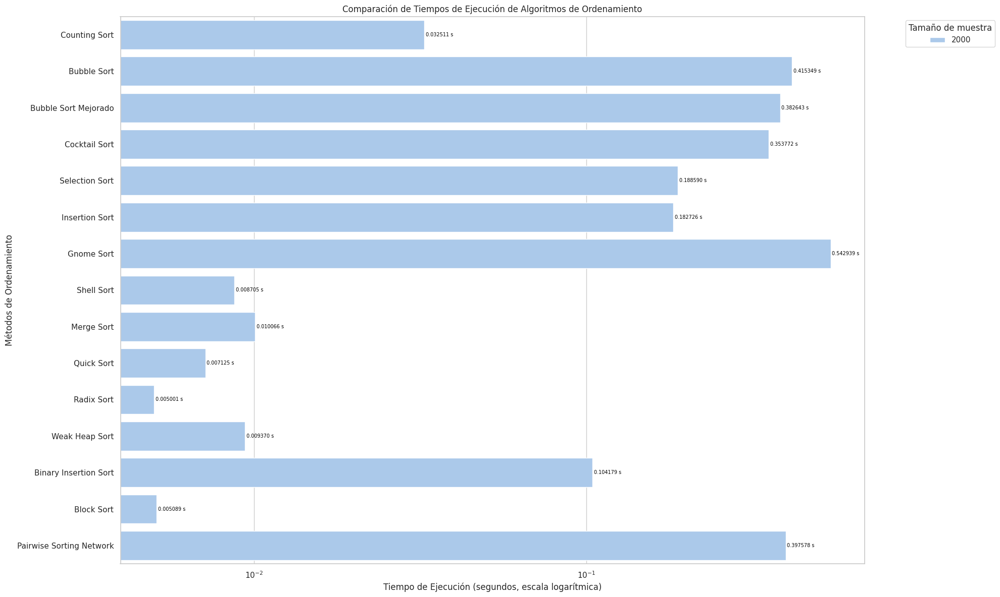

In [ ]:
plotSortingTimes(df2Results)

**Graficas de distribución de datos de la lista sampleOf2000DataOnAlzheimer**

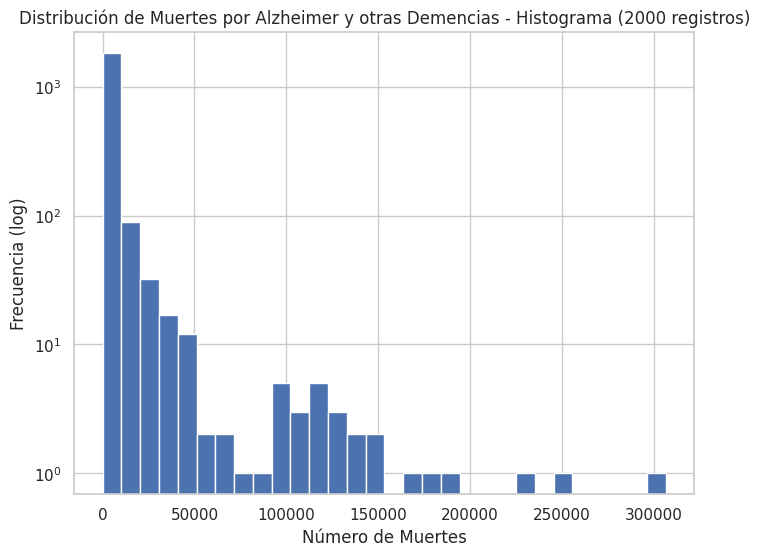

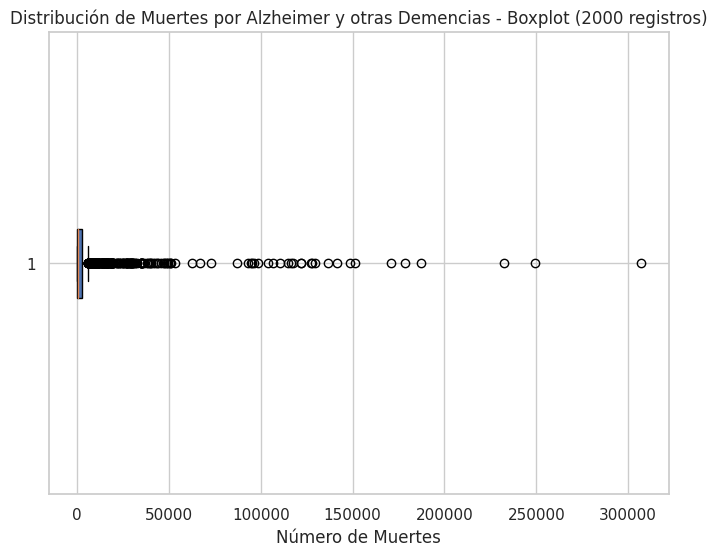

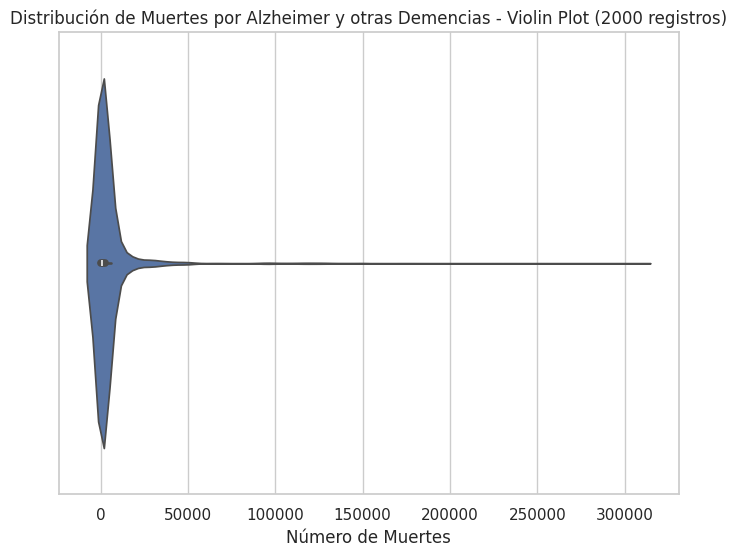

In [ ]:
plotDataDistribution(sampleOf2000DataOnAlzheimer, sample_name="2000 registros")

### **Prueba para 3000 elementos y tiempos de ejecucion**

**Generar la lista**

In [ ]:
sampleOf3000DataOnAlzheimer = getRandomSample(deathByAlzheimer, 3000)

Tamaño de la lista: 3000
Lista deathByAlzheimer con 3000 elementos: [5763, 4601, 1461, 1048, 562, 2829, 6220, 1, 398, 2041, 26650, 2, 1178, 2735, 27251, 3870, 0, 295, 57, 6379, 2990, 4496, 8, 255, 7051, 2, 76, 1335, 3259, 43470, 586, 1027, 1894, 1321, 139, 1706, 26918, 7254, 1456, 863, 1, 1081, 1184, 7543, 661, 496, 1229, 2872, 97, 15, 15, 1623, 2159, 35, 299, 34, 1019, 1781, 723, 2392, 57, 2365, 365, 39, 115, 55, 8506, 5340, 387, 12069, 17, 2, 20753, 15007, 1373, 2503, 656, 258, 5383, 1180, 4004, 15, 2, 0, 905, 85, 3134, 1255, 943, 22, 763, 22162, 931, 31868, 0, 402, 27539, 136, 3747, 138, 312, 10664, 666, 640, 1393, 16, 10326, 942, 13, 1629, 903, 790, 358, 1294, 14, 426, 281, 3585, 970, 1130, 60, 785, 631, 1714, 827, 18, 7217, 312, 8, 1488, 5138, 692, 1016, 55, 2069, 1480, 1293, 1, 1282, 882, 584, 9633, 1144, 1979, 57, 1766, 11384, 360, 14, 10131, 27, 464, 3542, 829, 10472, 723, 805, 470, 392, 133, 30679, 1383, 2952, 22, 1788, 4087, 722, 1062, 2404, 23706, 487, 1307, 4563, 1646, 856,

**Mostrar el paso a paso del método Radix Sort**

In [ ]:
radixSortWithSteps = stepByStepDecorator(radixSortDesc)
print("Usando Radix Sort:")
sortedDataRadixSort = radixSortWithSteps(sampleOf3000DataOnAlzheimer)

Usando Radix Sort:
------------------------------------------------------------------------
Mostrando 3000 elementos desordenados.
Lista original: [5763, 4601, 1461, 1048, 562, 2829, 6220, 1, 398, 2041, 26650, 2, 1178, 2735, 27251, 3870, 0, 295, 57, 6379, 2990, 4496, 8, 255, 7051, 2, 76, 1335, 3259, 43470, 586, 1027, 1894, 1321, 139, 1706, 26918, 7254, 1456, 863, 1, 1081, 1184, 7543, 661, 496, 1229, 2872, 97, 15, 15, 1623, 2159, 35, 299, 34, 1019, 1781, 723, 2392, 57, 2365, 365, 39, 115, 55, 8506, 5340, 387, 12069, 17, 2, 20753, 15007, 1373, 2503, 656, 258, 5383, 1180, 4004, 15, 2, 0, 905, 85, 3134, 1255, 943, 22, 763, 22162, 931, 31868, 0, 402, 27539, 136, 3747, 138, 312, 10664, 666, 640, 1393, 16, 10326, 942, 13, 1629, 903, 790, 358, 1294, 14, 426, 281, 3585, 970, 1130, 60, 785, 631, 1714, 827, 18, 7217, 312, 8, 1488, 5138, 692, 1016, 55, 2069, 1480, 1293, 1, 1282, 882, 584, 9633, 1144, 1979, 57, 1766, 11384, 360, 14, 10131, 27, 464, 3542, 829, 10472, 723, 805, 470, 392, 133, 30679, 

**Mostrar los tiempos de ejecución de los 15 métodos de ordenamiento**

In [ ]:
# Ejecutar las pruebas y obtener resultados
df3Results = measureSortingTimes(sortMethods, sampleOf3000DataOnAlzheimer)

# Mostrar la tabla con los resultados
df3Results.head(15)


Pruebas con lista de tamaño 3000:

Algoritmo: Counting Sort, Tiempo: 0.031438 segundos
Algoritmo: Bubble Sort, Tiempo: 0.895276 segundos
Algoritmo: Bubble Sort Mejorado, Tiempo: 0.870951 segundos
Algoritmo: Cocktail Sort, Tiempo: 0.767094 segundos
Algoritmo: Selection Sort, Tiempo: 0.402558 segundos
Algoritmo: Insertion Sort, Tiempo: 0.428866 segundos
Algoritmo: Gnome Sort, Tiempo: 1.154334 segundos
Algoritmo: Shell Sort, Tiempo: 0.012262 segundos
Algoritmo: Merge Sort, Tiempo: 0.012561 segundos
Algoritmo: Quick Sort, Tiempo: 0.008578 segundos
Algoritmo: Radix Sort, Tiempo: 0.007769 segundos
Algoritmo: Weak Heap Sort, Tiempo: 0.013512 segundos
Algoritmo: Binary Insertion Sort, Tiempo: 0.231415 segundos
Algoritmo: Block Sort, Tiempo: 0.009492 segundos
Algoritmo: Pairwise Sorting Network, Tiempo: 1.568309 segundos


,Algoritmo,Tamaño de muestra,Tiempo (s)
0,Counting Sort,3000,0.031438
1,Bubble Sort,3000,0.895276
2,Bubble Sort Mejorado,3000,0.870951
3,Cocktail Sort,3000,0.767094
4,Selection Sort,3000,0.402558
5,Insertion Sort,3000,0.428866
6,Gnome Sort,3000,1.154334
7,Shell Sort,3000,0.012262
8,Merge Sort,3000,0.012561
9,Quick Sort,3000,0.008578


**Graficar comparación de tiempos de ejecución de los 15 métodos de ordenamiento**

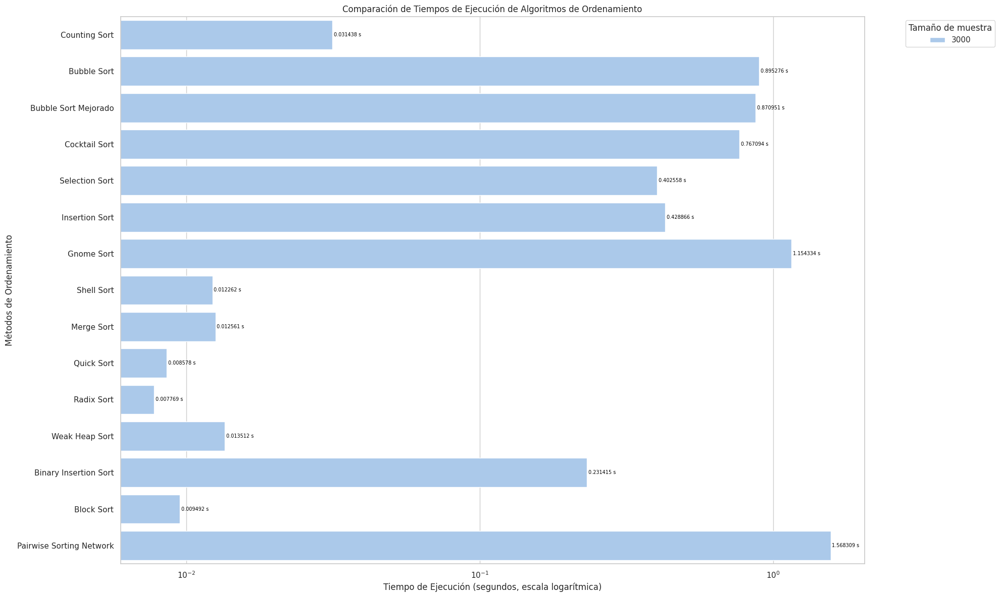

In [ ]:
plotSortingTimes(df3Results)

**Graficas de distribución de datos de la lista sampleOf3000DataOnAlzheimer**

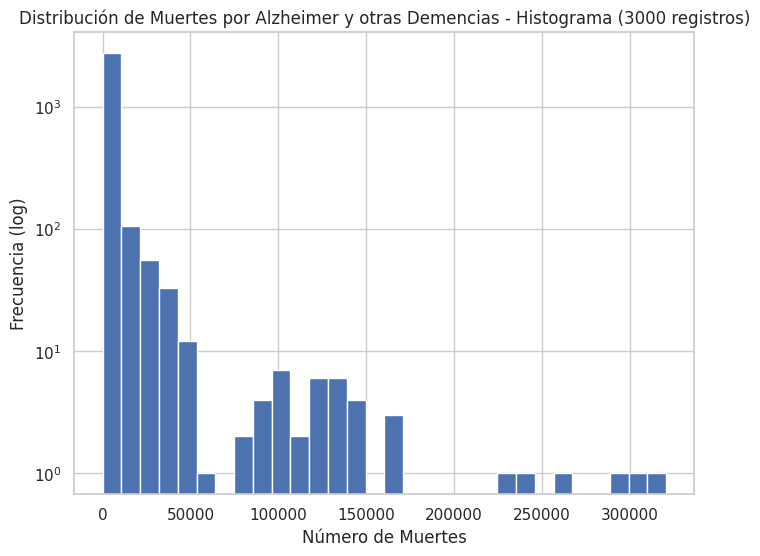

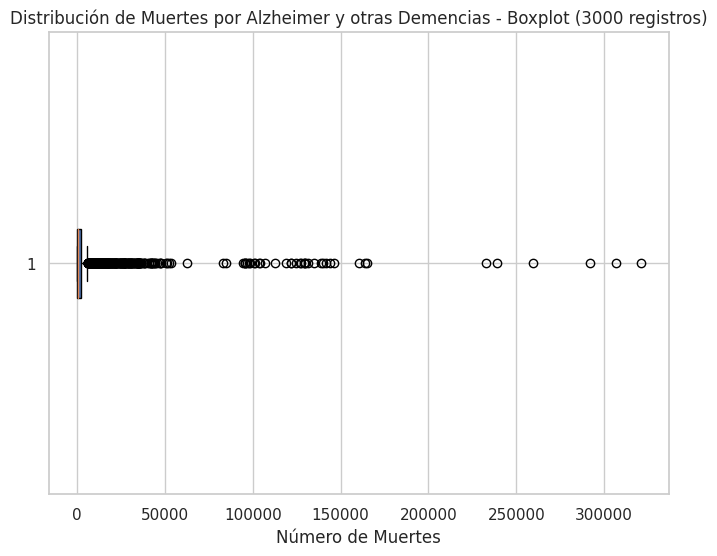

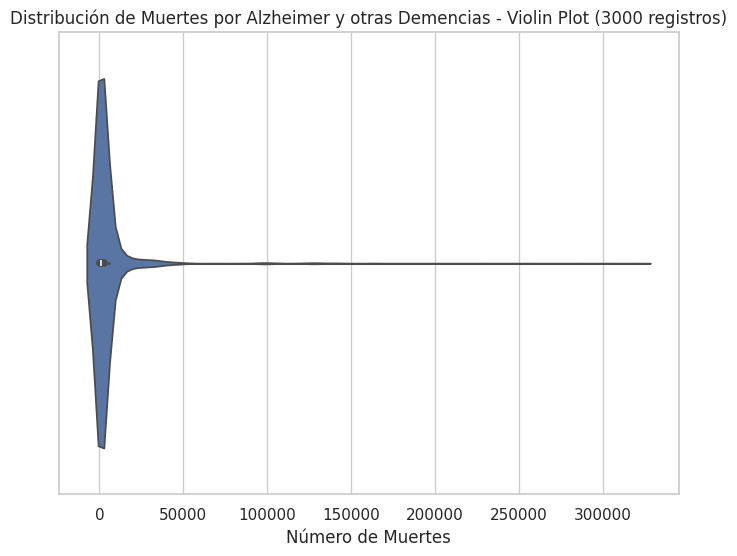

In [ ]:
plotDataDistribution(sampleOf3000DataOnAlzheimer, sample_name="3000 registros")

### **Prueba para 4000 elementos y tiempos de ejecucion**

**Generar la lista**

In [ ]:
sampleOf4000DataOnAlzheimer = getRandomSample(deathByAlzheimer, 4000) # Utiliza la funcion auxiliar para generar un arreglo con 4000 elementos aleatorios del arreglo original

Tamaño de la lista: 4000
Lista deathByAlzheimer con 4000 elementos: [106, 1450, 194, 206, 87, 859, 577, 13, 5399, 16, 768, 2, 15, 0, 2372, 4945, 17, 109, 0, 454, 13911, 5, 81, 81, 7104, 2118, 562, 657, 2537, 161, 2812, 579, 9999, 141, 3016, 40, 375, 18, 297, 790, 2523, 823, 151, 38347, 3001, 8, 9824, 1978, 6068, 195, 183, 242, 3, 8268, 17569, 308, 11668, 10, 35301, 253, 4633, 3, 117, 5749, 131, 308, 9640, 288, 1999, 729, 37, 1542, 3972, 0, 6281, 833, 71, 1, 275, 82, 14402, 138, 60, 2, 307, 48, 0, 1033, 46, 1888, 24, 1790, 289, 6, 18, 3212, 127, 150, 440, 103621, 961, 2026, 428, 134, 204, 51, 214, 2223, 36, 231, 652, 677, 767, 512, 129011, 275, 139, 1143, 1734, 2295, 41, 1569, 150, 5229, 849, 0, 126, 2263, 15, 1412, 681, 6268, 14414, 15, 943, 85, 52, 303, 13, 7500, 2239, 5, 1685, 923, 49, 3532, 90, 2265, 447, 426, 10, 1780, 4810, 25, 11811, 235, 106, 847, 9838, 314, 5515, 1394, 566, 139, 1098, 870, 586, 24, 839, 1666, 5369, 12, 6470, 1578, 697, 1231, 147, 21, 249056, 7671, 15, 176, 968,

**Mostrar el paso a paso del método Quick Sort**

In [ ]:
quickSortWithSteps = stepByStepDecorator(quickSortDesc)
print("Usando Quick Sort:")
sortedDataQuickSort = quickSortWithSteps(sampleOf4000DataOnAlzheimer)

Usando Quick Sort:
------------------------------------------------------------------------
Mostrando 4000 elementos desordenados.
Lista original: [106, 1450, 194, 206, 87, 859, 577, 13, 5399, 16, 768, 2, 15, 0, 2372, 4945, 17, 109, 0, 454, 13911, 5, 81, 81, 7104, 2118, 562, 657, 2537, 161, 2812, 579, 9999, 141, 3016, 40, 375, 18, 297, 790, 2523, 823, 151, 38347, 3001, 8, 9824, 1978, 6068, 195, 183, 242, 3, 8268, 17569, 308, 11668, 10, 35301, 253, 4633, 3, 117, 5749, 131, 308, 9640, 288, 1999, 729, 37, 1542, 3972, 0, 6281, 833, 71, 1, 275, 82, 14402, 138, 60, 2, 307, 48, 0, 1033, 46, 1888, 24, 1790, 289, 6, 18, 3212, 127, 150, 440, 103621, 961, 2026, 428, 134, 204, 51, 214, 2223, 36, 231, 652, 677, 767, 512, 129011, 275, 139, 1143, 1734, 2295, 41, 1569, 150, 5229, 849, 0, 126, 2263, 15, 1412, 681, 6268, 14414, 15, 943, 85, 52, 303, 13, 7500, 2239, 5, 1685, 923, 49, 3532, 90, 2265, 447, 426, 10, 1780, 4810, 25, 11811, 235, 106, 847, 9838, 314, 5515, 1394, 566, 139, 1098, 870, 586, 24, 8

**Mostrar los tiempos de ejecución de los 15 métodos de ordenamiento**

In [ ]:
# Ejecutar las pruebas y obtener resultados
df4Results = measureSortingTimes(sortMethods, sampleOf4000DataOnAlzheimer)

# Mostrar la tabla con los resultados
df4Results.head(15)


Pruebas con lista de tamaño 4000:

Algoritmo: Counting Sort, Tiempo: 0.048127 segundos
Algoritmo: Bubble Sort, Tiempo: 2.809452 segundos
Algoritmo: Bubble Sort Mejorado, Tiempo: 1.562770 segundos
Algoritmo: Cocktail Sort, Tiempo: 1.375934 segundos
Algoritmo: Selection Sort, Tiempo: 0.696769 segundos
Algoritmo: Insertion Sort, Tiempo: 0.750257 segundos
Algoritmo: Gnome Sort, Tiempo: 2.094903 segundos
Algoritmo: Shell Sort, Tiempo: 0.015777 segundos
Algoritmo: Merge Sort, Tiempo: 0.016942 segundos
Algoritmo: Quick Sort, Tiempo: 0.012804 segundos
Algoritmo: Radix Sort, Tiempo: 0.011081 segundos
Algoritmo: Weak Heap Sort, Tiempo: 0.018730 segundos
Algoritmo: Binary Insertion Sort, Tiempo: 0.434397 segundos
Algoritmo: Block Sort, Tiempo: 0.013877 segundos
Algoritmo: Pairwise Sorting Network, Tiempo: 1.555588 segundos


,Algoritmo,Tamaño de muestra,Tiempo (s)
0,Counting Sort,4000,0.048127
1,Bubble Sort,4000,2.809452
2,Bubble Sort Mejorado,4000,1.562770
3,Cocktail Sort,4000,1.375934
4,Selection Sort,4000,0.696769
5,Insertion Sort,4000,0.750257
6,Gnome Sort,4000,2.094903
7,Shell Sort,4000,0.015777
8,Merge Sort,4000,0.016942
9,Quick Sort,4000,0.012804


**Graficar comparación de tiempos de ejecución de los 15 métodos de ordenamiento**

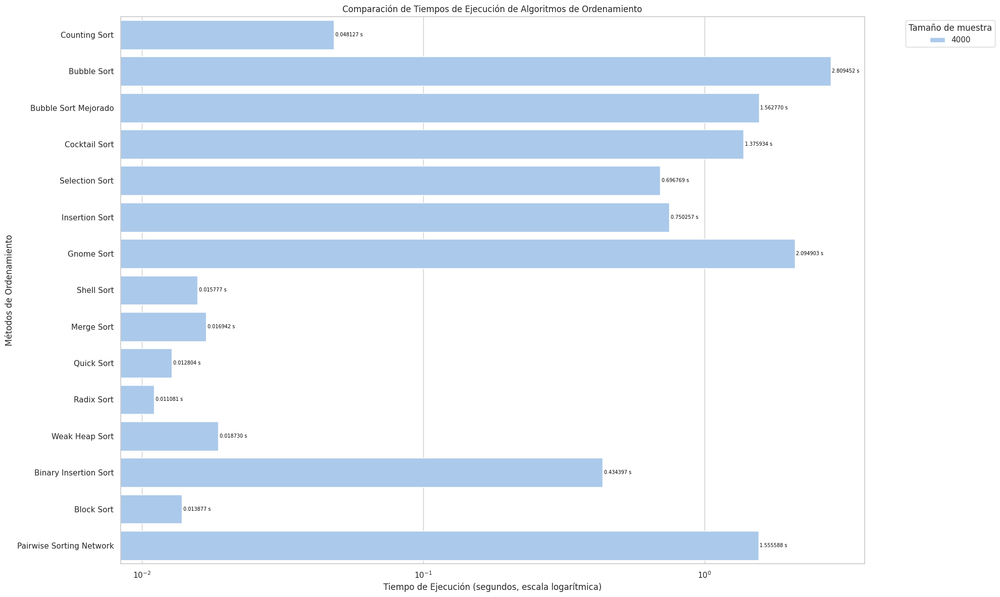

In [ ]:
plotSortingTimes(df4Results)

**Graficas de distribución de datos de la lista sampleOf4000DataOnAlzheimer**

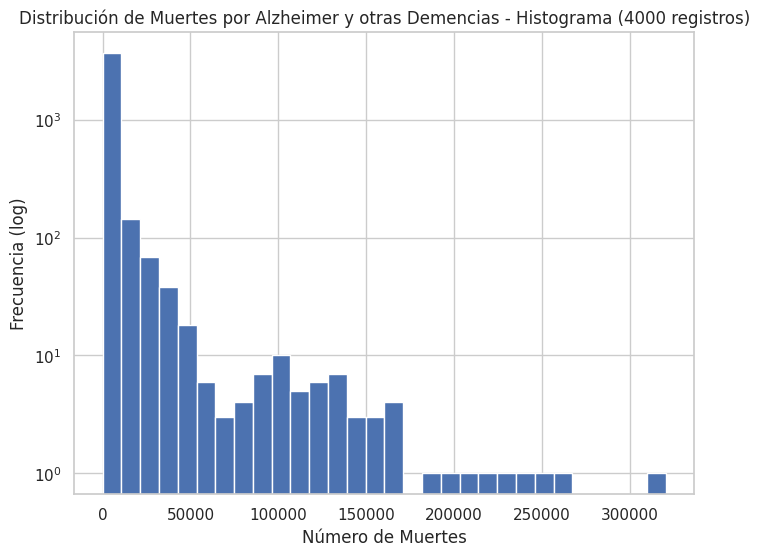

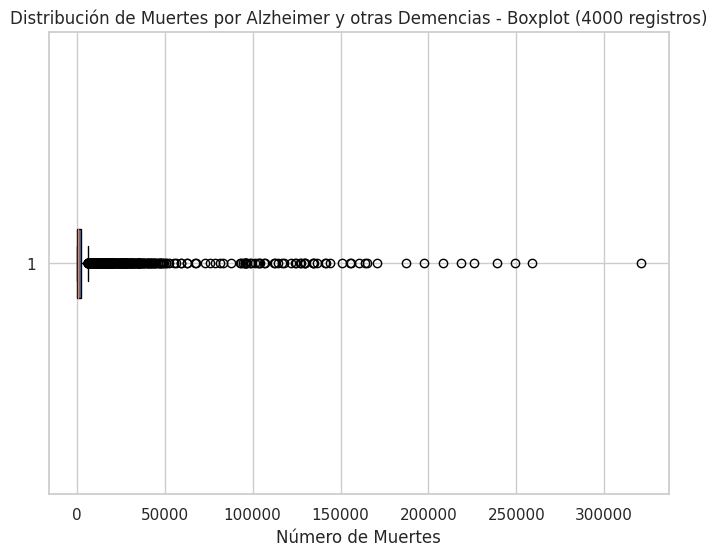

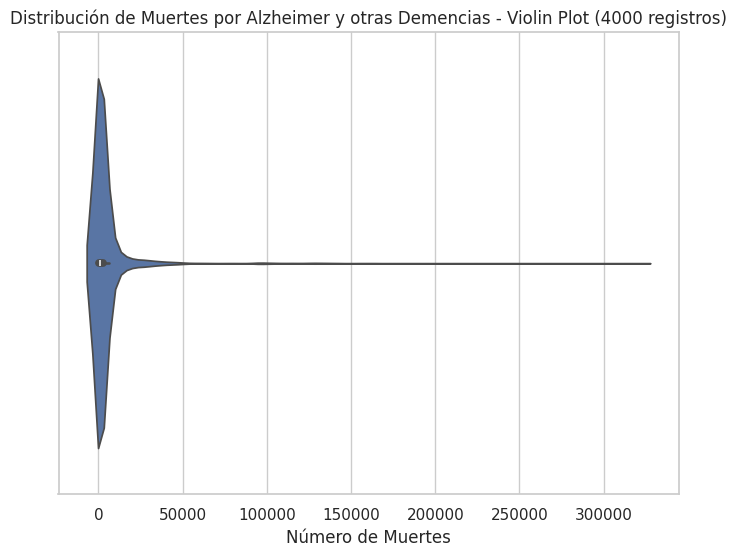

In [ ]:
plotDataDistribution(sampleOf4000DataOnAlzheimer, sample_name="4000 registros")

### **Prueba para 5000 elementos y tiempos de ejecucion**

**Generar la lista**

In [ ]:
sampleOf5000DataOnAlzheimer = getRandomSample(deathByAlzheimer, 5000)

Tamaño de la lista: 5000
Lista deathByAlzheimer con 5000 elementos: [3253, 1846, 31, 959, 471, 4188, 125, 2466, 365, 55, 19, 78, 1, 1133, 39890, 6469, 2169, 26, 24322, 2725, 18, 13792, 255, 18, 2433, 2428, 637, 7635, 1, 26820, 2354, 57, 449, 1722, 1300, 8, 71, 91, 29, 98558, 1943, 5, 425, 132, 1, 810, 681, 423, 1381, 891, 15, 3328, 10525, 1255, 2691, 26, 579, 1826, 26918, 27698, 109, 3573, 136, 993, 3667, 11577, 5229, 373, 230, 2820, 2651, 89, 3658, 16, 327, 1151, 2474, 0, 15, 709, 1192, 273, 3739, 1436, 426, 31, 26677, 46, 773, 4, 8, 495, 1243, 1911, 56, 2702, 306747, 28, 109, 770, 898, 3, 27, 2351, 111481, 24271, 1209, 35368, 989, 4802, 6603, 123, 7, 1582, 32, 127660, 2405, 184, 261, 7, 931, 10257, 143, 42303, 467, 16671, 17, 35, 3261, 589, 2544, 3575, 309, 27, 249056, 1076, 1374, 2055, 673, 75, 559, 2685, 375, 3710, 1941, 1494, 2179, 5843, 359, 471, 9, 6, 233, 74, 2682, 822, 704, 8659, 1, 272, 118, 12, 464, 8064, 543, 2, 707, 19, 103, 536, 520, 1237, 0, 1410, 918, 1362, 4675, 41, 10

**Mostrar el paso a paso del método Merge Sort**

In [ ]:
mergeSortWithSteps1 = stepByStepDecorator(mergeSortDesc)
print("Usando Merge Sort:")
sortedDataMergekSort1 = mergeSortWithSteps1(sampleOf5000DataOnAlzheimer)

Se han truncado las últimas 5000 líneas del flujo de salida.
                      Combinando: [4266, 657] ... (mostrando 2 elementos)
                        Dividiendo: [32, 4621] ... (mostrando 2 elementos)
                        Combinando: [4621, 32] ... (mostrando 2 elementos)
                      Dividiendo: [2558, 32, 4621] ... (mostrando 3 elementos)
                      Combinando: [4621, 2558, 32] ... (mostrando 3 elementos)
                    Dividiendo: [4266, 657, 2558, 32, 4621] ... (mostrando 5 elementos)
                    Combinando: [4621, 4266, 2558, 657, 32] ... (mostrando 5 elementos)
                  Dividiendo: [1810, 1767, 4, 31, 4266, 657, 2558, 32, 4621] ... (mostrando 9 elementos)
                  Combinando: [4621, 4266, 2558, 1810, 1767, 657, 32, 31, 4] ... (mostrando 9 elementos)
                      Dividiendo: [50, 1012] ... (mostrando 2 elementos)
                      Combinando: [1012, 50] ... (mostrando 2 elementos)
                        D

**Mostrar los tiempos de ejecución de los 15 métodos de ordenamiento**

In [ ]:
# Ejecutar las pruebas y obtener resultados
df5Results = measureSortingTimes(sortMethods, sampleOf5000DataOnAlzheimer)

# Mostrar la tabla con los resultados
df5Results.head(15)


Pruebas con lista de tamaño 5000:

Algoritmo: Counting Sort, Tiempo: 0.044525 segundos
Algoritmo: Bubble Sort, Tiempo: 2.791213 segundos
Algoritmo: Bubble Sort Mejorado, Tiempo: 2.460576 segundos
Algoritmo: Cocktail Sort, Tiempo: 2.077309 segundos
Algoritmo: Selection Sort, Tiempo: 1.096815 segundos
Algoritmo: Insertion Sort, Tiempo: 1.139172 segundos
Algoritmo: Gnome Sort, Tiempo: 4.744824 segundos
Algoritmo: Shell Sort, Tiempo: 0.024464 segundos
Algoritmo: Merge Sort, Tiempo: 0.021984 segundos
Algoritmo: Quick Sort, Tiempo: 0.015434 segundos
Algoritmo: Radix Sort, Tiempo: 0.012614 segundos
Algoritmo: Weak Heap Sort, Tiempo: 0.023200 segundos
Algoritmo: Binary Insertion Sort, Tiempo: 0.644995 segundos
Algoritmo: Block Sort, Tiempo: 0.018182 segundos
Algoritmo: Pairwise Sorting Network, Tiempo: 2.369638 segundos


,Algoritmo,Tamaño de muestra,Tiempo (s)
0,Counting Sort,5000,0.044525
1,Bubble Sort,5000,2.791213
2,Bubble Sort Mejorado,5000,2.460576
3,Cocktail Sort,5000,2.077309
4,Selection Sort,5000,1.096815
5,Insertion Sort,5000,1.139172
6,Gnome Sort,5000,4.744824
7,Shell Sort,5000,0.024464
8,Merge Sort,5000,0.021984
9,Quick Sort,5000,0.015434


**Graficar comparación de tiempos de ejecución de los 15 métodos de ordenamiento**

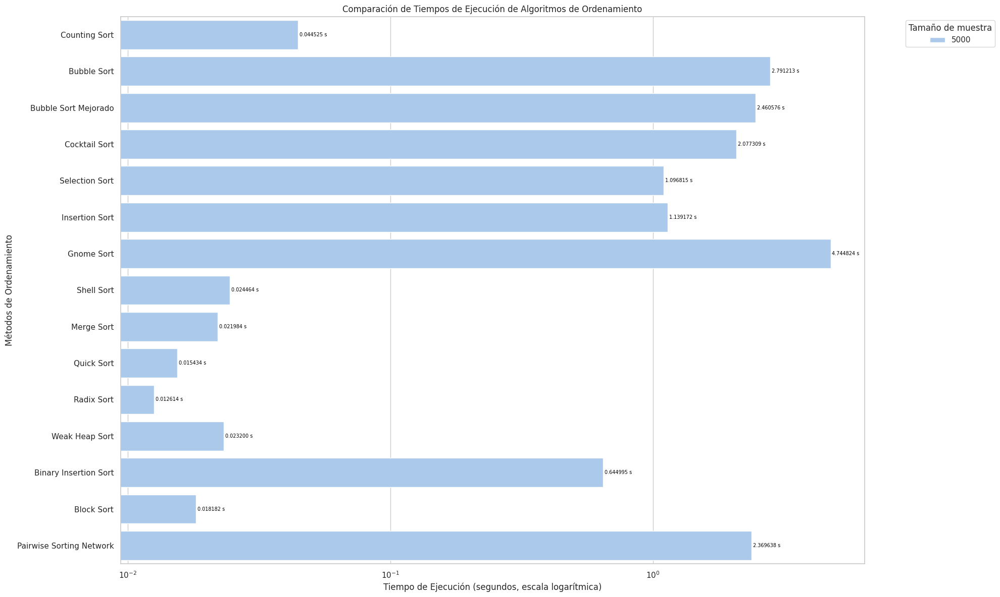

In [ ]:
plotSortingTimes(df5Results)

**Graficas de distribución de datos de la lista sampleOf5000DataOnAlzheimer**

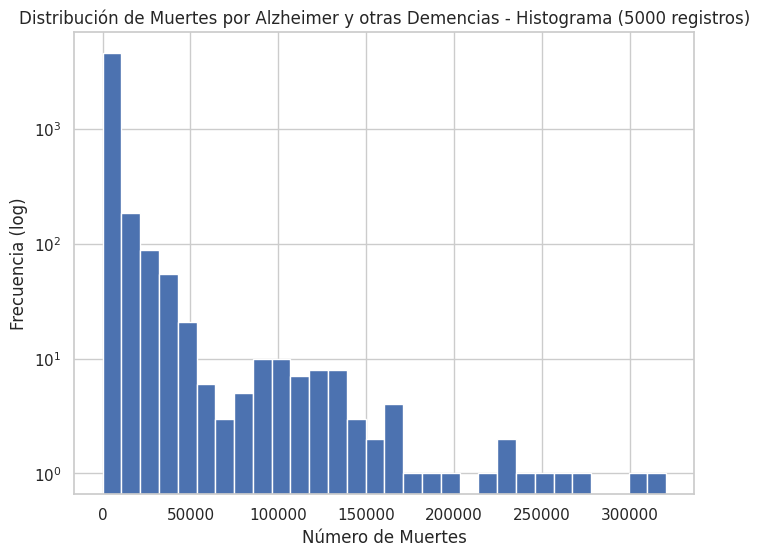

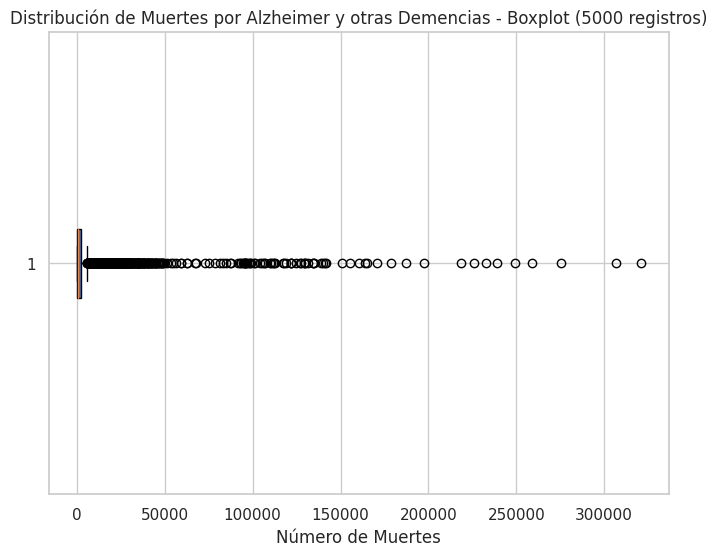

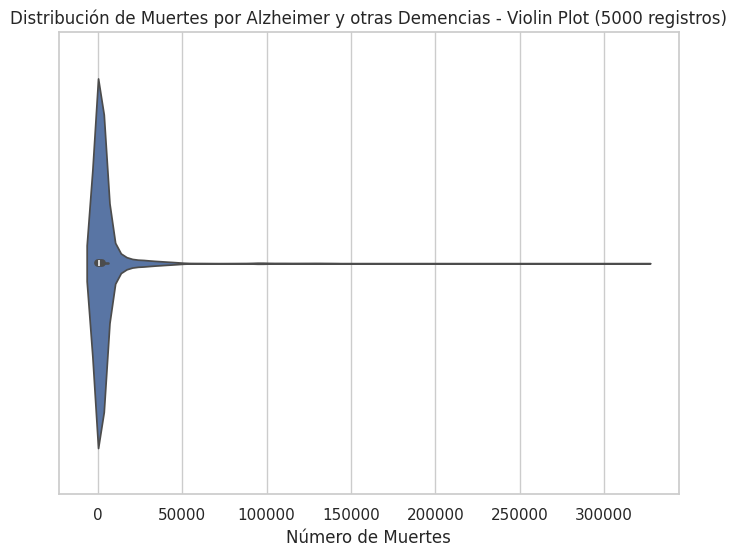

In [ ]:
plotDataDistribution(sampleOf5000DataOnAlzheimer, sample_name="5000 registros")

### **Prueba para 6120 elementos y tiempos de ejecucion**

**Generar la lista**

In [ ]:
sampleOf6120DataOnAlzheimer = deathByAlzheimer
print(f"Tamaño de la lista: {len(sampleOf6120DataOnAlzheimer)}")
print(f"Lista deathByAlzheimer con  {len(sampleOf6120DataOnAlzheimer)} elementos: {sampleOf6120DataOnAlzheimer}")

Tamaño de la lista: 6120
Lista deathByAlzheimer con  6120 elementos: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 1016, 1080, 1143, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14,

**Mostrar el paso a paso del método Merge Sort**

In [ ]:
radixSortWithSteps2 = stepByStepDecorator(radixSortDesc)
print("Usando Radix Sort:")
sortedDataMergekSort2 = radixSortWithSteps2(sampleOf6120DataOnAlzheimer)

Usando Radix Sort:
------------------------------------------------------------------------
Mostrando 6120 elementos desordenados.
Lista original: [1116, 1136, 1162, 1187, 1211, 1225, 1239, 1253, 1267, 1281, 1291, 1300, 1311, 1326, 1344, 1362, 1381, 1402, 1424, 1449, 1476, 1508, 1544, 1581, 1620, 1652, 1690, 1728, 1757, 1775, 360, 363, 365, 368, 373, 382, 391, 400, 411, 425, 438, 451, 471, 489, 501, 514, 527, 543, 567, 590, 616, 647, 678, 710, 743, 776, 809, 844, 880, 917, 1337, 1411, 1494, 1582, 1675, 1763, 1855, 1945, 2037, 2129, 2219, 2313, 2411, 2508, 2618, 2732, 2847, 2976, 3102, 3247, 3401, 3573, 3757, 3936, 4136, 4343, 4563, 4790, 5005, 5209, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 6, 7, 8, 9, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 28, 28, 30, 31, 32, 33, 34, 35, 36, 36, 293, 303, 315, 326, 336, 347, 359, 373, 391, 409, 426, 443, 464, 487, 513, 536, 564, 589, 619, 653, 690, 730, 771, 812, 853, 905, 958, 101

**Mostrar los tiempos de ejecución de los 15 métodos de ordenamiento**

In [ ]:
# Ejecutar las pruebas y obtener resultados
df6Results = measureSortingTimes(sortMethods, sampleOf6120DataOnAlzheimer)

# Mostrar la tabla con los resultados
df6Results.head(15)


Pruebas con lista de tamaño 6120:

Algoritmo: Counting Sort, Tiempo: 0.030528 segundos
Algoritmo: Bubble Sort, Tiempo: 3.767678 segundos
Algoritmo: Bubble Sort Mejorado, Tiempo: 3.706645 segundos
Algoritmo: Cocktail Sort, Tiempo: 4.752671 segundos
Algoritmo: Selection Sort, Tiempo: 1.629604 segundos
Algoritmo: Insertion Sort, Tiempo: 1.760470 segundos
Algoritmo: Gnome Sort, Tiempo: 4.995136 segundos
Algoritmo: Shell Sort, Tiempo: 0.030456 segundos
Algoritmo: Merge Sort, Tiempo: 0.024766 segundos
Algoritmo: Quick Sort, Tiempo: 0.037838 segundos
Algoritmo: Radix Sort, Tiempo: 0.016369 segundos
Algoritmo: Weak Heap Sort, Tiempo: 0.028894 segundos
Algoritmo: Binary Insertion Sort, Tiempo: 1.125562 segundos
Algoritmo: Block Sort, Tiempo: 0.043591 segundos
Algoritmo: Pairwise Sorting Network, Tiempo: 5.018162 segundos


,Algoritmo,Tamaño de muestra,Tiempo (s)
0,Counting Sort,6120,0.030528
1,Bubble Sort,6120,3.767678
2,Bubble Sort Mejorado,6120,3.706645
3,Cocktail Sort,6120,4.752671
4,Selection Sort,6120,1.629604
5,Insertion Sort,6120,1.760470
6,Gnome Sort,6120,4.995136
7,Shell Sort,6120,0.030456
8,Merge Sort,6120,0.024766
9,Quick Sort,6120,0.037838


**Graficar comparación de tiempos de ejecución de los 15 métodos de ordenamiento**

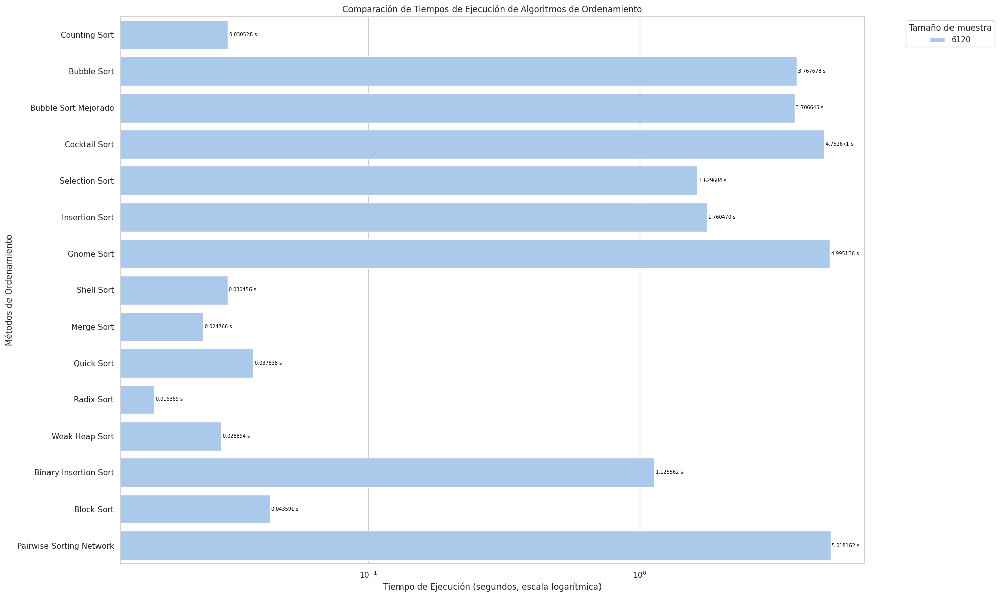

In [ ]:
plotSortingTimes(df6Results)

**Graficas de distribución de datos de la lista sampleOf6120DataOnAlzheimer**

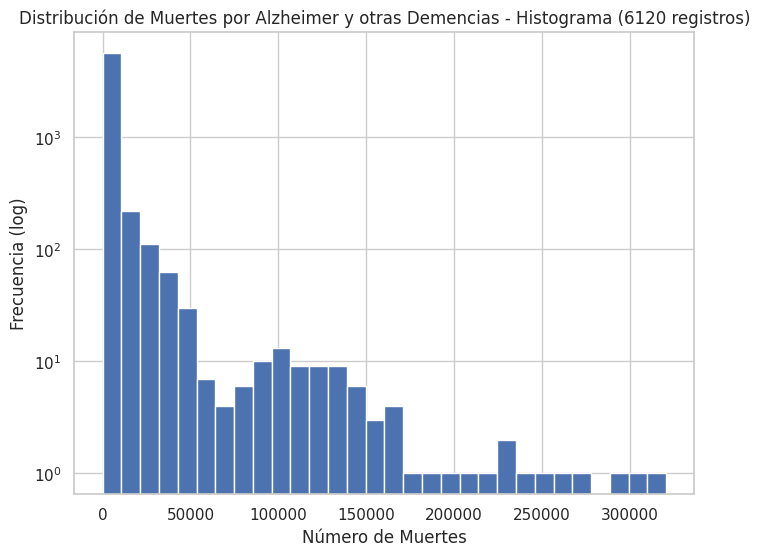

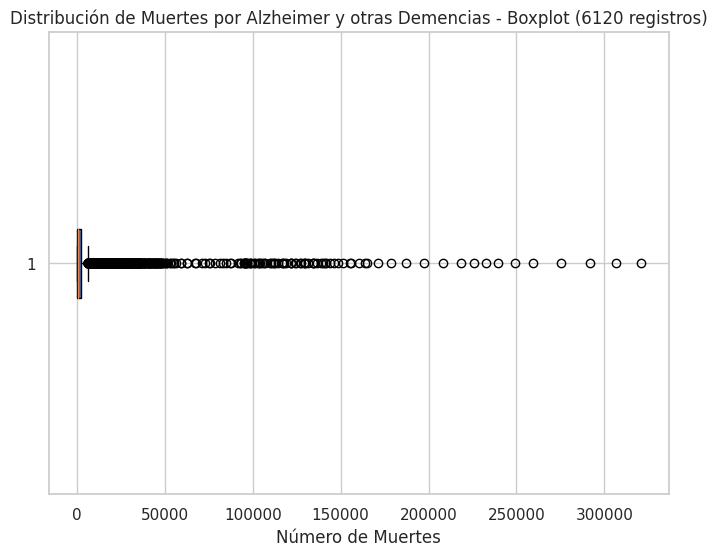

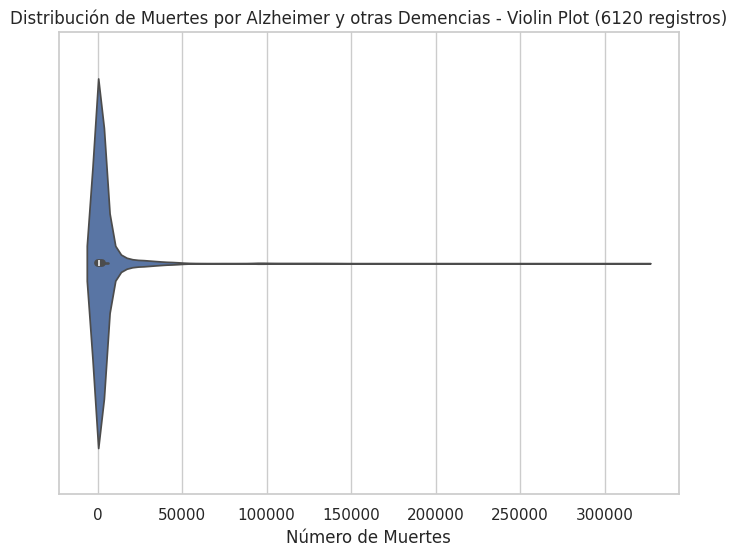

In [ ]:
plotDataDistribution(sampleOf6120DataOnAlzheimer, sample_name="6120 registros")

### **Visualización gráfica de los tiempos de ejecución de los 15 métodos de ordenamiento y los diferentes tamaños de listas generados**

**Mostrar tabla de los tiempos de ejecución de los 15 métodos de ordenamiento**

In [ ]:
dfTotalDataFrames = pd.concat([df2Results, df3Results, df4Results, df5Results, df6Results], ignore_index=True)
dfTotalDataFrames

,Algoritmo,Tamaño de muestra,Tiempo (s)
0,Counting Sort,2000,0.032511
1,Bubble Sort,2000,0.415349
2,Bubble Sort Mejorado,2000,0.382643
3,Cocktail Sort,2000,0.353772
4,Selection Sort,2000,0.188590
...,...,...,...
70,Radix Sort,6120,0.016369
71,Weak Heap Sort,6120,0.028894
72,Binary Insertion Sort,6120,1.125562
73,Block Sort,6120,0.043591


**Graficar comparación de tiempos de ejecución de los 15 métodos de ordenamiento**

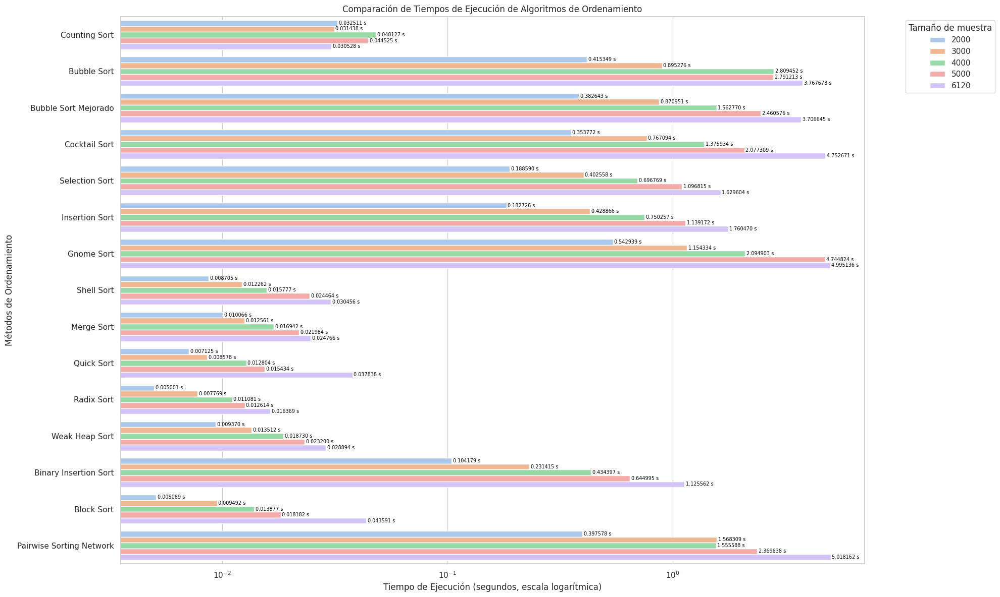

In [ ]:
plotSortingTimes(dfTotalDataFrames)